Problem Statement:
Flight ticket prices can be something hard to guess, today we might see a price, check out the price of the same flight tomorrow, it will be a different story. We might have often heard travellers saying that flight ticket prices are so unpredictable. Here you will be provided with prices of flight tickets for various airlines between the months of March and June of 2019 and between various cities.

Size of training set: 10683 records

Size of test set: 2671 records

FEATURES:
Airline: The name of the airline.

Date_of_Journey: The date of the journey

Source: The source from which the service begins.

Destination: The destination where the service ends.

Route: The route taken by the flight to reach the destination.

Dep_Time: The time when the journey starts from the source.

Arrival_Time: Time of arrival at the destination.

Duration: Total duration of the flight.

Total_Stops: Total stops between the source and destination.

Additional_Info: Additional information about the flight

Price: The price of the ticket

In [4]:
# Importing requried library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [5]:
#Load Dataset
df_train = pd.read_excel("Data_Train.xlsx")

i first downloaded the zipfile then imported in jupiter notebook

In [6]:
df_train

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


In [7]:
df_train.head()  #showing first five rows

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302


In [8]:
df_train.tail()  #showing last five rows

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648
10682,Air India,9/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,10:55,19:15,8h 20m,2 stops,No info,11753


we are taking a look at the first 5 and last 5 rows of our entire training data set.

In [9]:
pd.set_option('display.max_rows',None)

pd.set_option('display.max_rows',None) - main purpose of using this is it will display all rows (if more than 10 rows) instead of first 5 and last 5.


In [10]:
df_train.shape #Dimension of dataset

(10683, 11)

There are 10683 rows and 11 columns present in dataset.

In [11]:
data_tabel=[]

for i in df_train.columns:
    data_tabel.append([i,df_train[i].nunique(),df_train[i].drop_duplicates().values])

In [12]:
pd.DataFrame(data_tabel,columns=['Features','Unique_Number','Values'])

,Features,Unique_Number,Values
0,Airline,12,"[IndiGo, Air India, Jet Airways, SpiceJet, Mul..."
1,Date_of_Journey,44,"[24/03/2019, 1/05/2019, 9/06/2019, 12/05/2019,..."
2,Source,5,"[Banglore, Kolkata, Delhi, Chennai, Mumbai]"
3,Destination,6,"[New Delhi, Banglore, Cochin, Kolkata, Delhi, ..."
4,Route,128,"[BLR → DEL, CCU → IXR → BBI → BLR, DEL → LKO →..."
5,Dep_Time,222,"[22:20, 05:50, 09:25, 18:05, 16:50, 09:00, 18:..."
6,Arrival_Time,1343,"[01:10 22 Mar, 13:15, 04:25 10 Jun, 23:30, 21:..."
7,Duration,368,"[2h 50m, 7h 25m, 19h, 5h 25m, 4h 45m, 2h 25m, ..."
8,Total_Stops,5,"[non-stop, 2 stops, 1 stop, 3 stops, nan, 4 st..."
9,Additional_Info,10,"[No info, In-flight meal not included, No chec..."


In [13]:
df_train.info()  #information about dataset like data type, Null values etc.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [14]:
df_train.describe()

,Price
count,10683.000000
mean,9087.064121
std,4611.359167
min,1759.000000
25%,5277.000000
50%,8372.000000
75%,12373.000000
max,79512.000000


In [15]:
df_train.dtypes   #datatype

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

In [16]:
df_train.isnull().sum()  #to check for null value.

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              1
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        1
Additional_Info    0
Price              0
dtype: int64

In this dataset, Route and Total stop there is not null value present and rest of the data null values are present

In [17]:
df_train.duplicated().sum()

220

In given dataset duplictes values are present

In [18]:
df_train.drop_duplicates()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [19]:
print(f"Rows and Columns before dropping null values: ", df_train.shape)
df_train.dropna(inplace=True)
print(f"Rows and Columns after dropping null values: ", df_train.shape)

Rows and Columns before dropping null values:  (10683, 11)
Rows and Columns after dropping null values:  (10682, 11)


I have removed all the null valued rows and checked for the row and column information.

<AxesSubplot:>

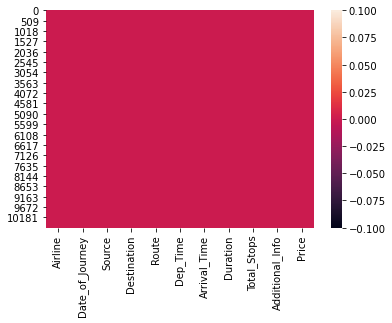

In [20]:
#Let's visualized null values.

sns.heatmap(df_train.isnull())

In [21]:
df_train.isnull().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
Price              0
dtype: int64

we have no missing data present in our training dataset. Also we have taken care of duplicate rows that were present in our dataset.


<AxesSubplot:>

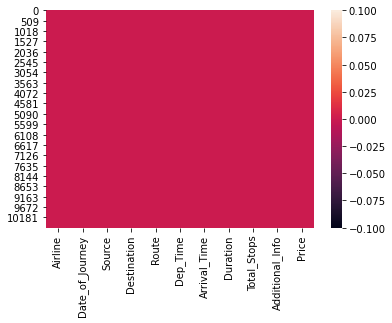

In [22]:
#Let's visualized null values.

sns.heatmap(df_train.isnull())

Above outcome helps to visualized null values.

In [23]:
numeric_features=[features for features in df_train.columns if df_train[features].dtype!='O']
print('Length Of Numeric_Features',len(numeric_features))
numeric_features

Length Of Numeric_Features 1


['Price']

In [24]:
categorical_features=[features for features in df_train.columns if df_train[features].dtype=='O']
print('Length Of Categorical_features',len(categorical_features))
categorical_features

Length Of Categorical_features 10


['Airline',
 'Date_of_Journey',
 'Source',
 'Destination',
 'Route',
 'Dep_Time',
 'Arrival_Time',
 'Duration',
 'Total_Stops',
 'Additional_Info']

In [25]:
discreat_features=[features for features in numeric_features if len(df_train[features].unique())<25]
discreat_features

[]

In [26]:
continues_features=[features for features in numeric_features if len(df_train[features].unique())>25]
print('Length Of Continues_Features',len(continues_features))
continues_features

Length Of Continues_Features 1


['Price']

 Data Visualization

In [27]:
df_train.count()

Airline            10682
Date_of_Journey    10682
Source             10682
Destination        10682
Route              10682
Dep_Time           10682
Arrival_Time       10682
Duration           10682
Total_Stops        10682
Additional_Info    10682
Price              10682
dtype: int64

Text(0.5, 0, 'Price')

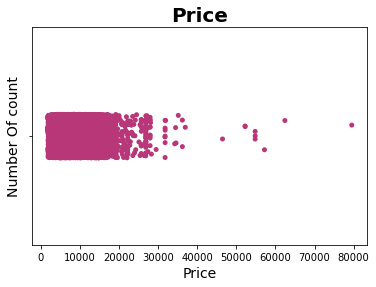

In [28]:
sns.stripplot(df_train['Price'],data=df_train,palette='magma')
plt.title('Price',fontdict={'fontweight':'bold','fontsize':20})
plt.ylabel("Number Of count",fontsize=14)
plt.xlabel('Price',fontsize=14)

I am dropping the column named "Year_of_Journey" as it only has one uniqye value covering all the rows in the column and therefore it wont add much value to our prediction model later.


In [29]:
def date_bifurcation(df):
    df=df.copy()
    df['Date_of_Journey']=pd.to_datetime(df['Date_of_Journey'])
    df['Year_of_Journey']=df['Date_of_Journey'].dt.year
    df['Month_of_Journey']=df['Date_of_Journey'].dt.month
    df['Day_of_Journey']=df['Date_of_Journey'].dt.day
    df=df.drop(['Route', 'Date_of_Journey', 'Duration'],axis=1)
    return df

df_train = date_bifurcation(df_train)
print(f"Rows and Columns:", df_train.shape)
df_train.head()

Rows and Columns: (10682, 11)


,Airline,Source,Destination,Dep_Time,Arrival_Time,Total_Stops,Additional_Info,Price,Year_of_Journey,Month_of_Journey,Day_of_Journey
0,IndiGo,Banglore,New Delhi,22:20,01:10 22 Mar,non-stop,No info,3897,2019,3,24
1,Air India,Kolkata,Banglore,05:50,13:15,2 stops,No info,7662,2019,1,5
2,Jet Airways,Delhi,Cochin,09:25,04:25 10 Jun,2 stops,No info,13882,2019,9,6
3,IndiGo,Kolkata,Banglore,18:05,23:30,1 stop,No info,6218,2019,12,5
4,IndiGo,Banglore,New Delhi,16:50,21:35,1 stop,No info,13302,2019,1,3


I have created a function that basically separates the date information into proper numerical format instead of making it an object datatype.

In [30]:
def time_bifurcation(df):
    df['Departure_hour']=pd.to_datetime(df['Dep_Time']).dt.hour
    df['Departure_minute']=pd.to_datetime(df['Dep_Time']).dt.minute
    df=df.drop(['Dep_Time'],axis=1)
    df['Arrival_hour']=pd.to_datetime(df['Arrival_Time']).dt.hour
    df['Arrival_minute']=pd.to_datetime(df['Arrival_Time']).dt.minute
    df=df.drop(['Arrival_Time'],axis=1)
    return df

df_train = time_bifurcation(df_train)
print(f"Rows and Columns:", df_train.shape)
df_train.head()

Rows and Columns: (10682, 13)


,Airline,Source,Destination,Total_Stops,Additional_Info,Price,Year_of_Journey,Month_of_Journey,Day_of_Journey,Departure_hour,Departure_minute,Arrival_hour,Arrival_minute
0,IndiGo,Banglore,New Delhi,non-stop,No info,3897,2019,3,24,22,20,1,10
1,Air India,Kolkata,Banglore,2 stops,No info,7662,2019,1,5,5,50,13,15
2,Jet Airways,Delhi,Cochin,2 stops,No info,13882,2019,9,6,9,25,4,25
3,IndiGo,Kolkata,Banglore,1 stop,No info,6218,2019,12,5,18,5,23,30
4,IndiGo,Banglore,New Delhi,1 stop,No info,13302,2019,1,3,16,50,21,35


I have created another function that deals with the separation on timings for arrival and departure. This allows me to get a proper insight on the flight duration details as well therefore I got rid of the duration column earlier.


In [31]:
df_train.drop("Year_of_Journey", axis=1, inplace=True)

I am dropping the column named "Year_of_Journey" as it only has one uniqye value covering all the rows in the column and therefore it wont add much value to our prediction model later.

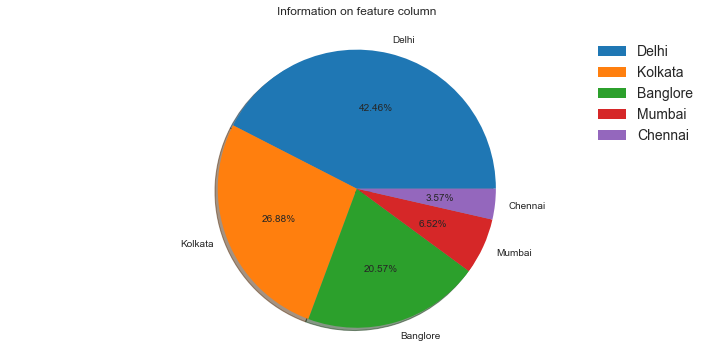

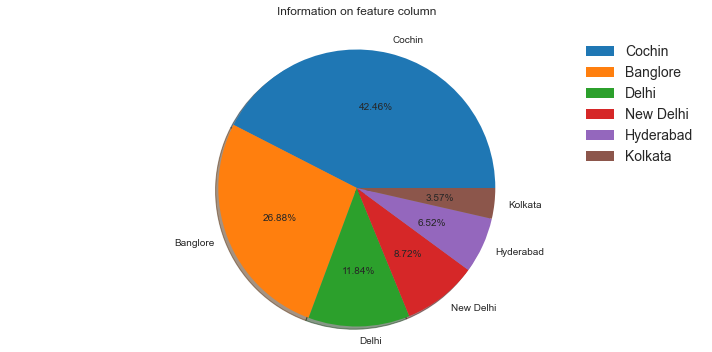

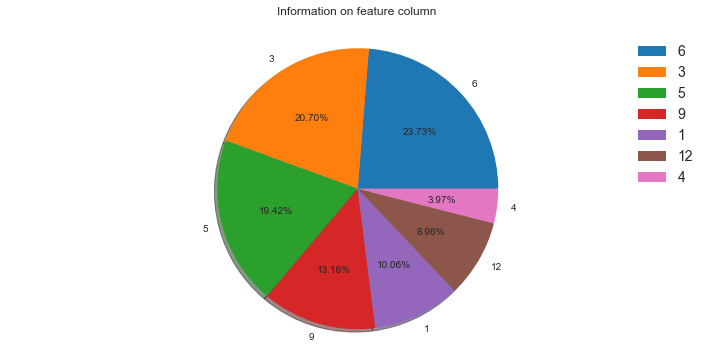

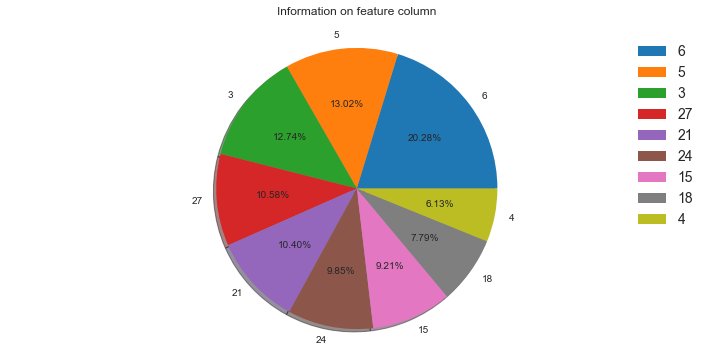

In [32]:
def generate_pie(x):
    plt.style.use('seaborn-white')
    plt.figure(figsize=(10,5))
    plt.pie(x.value_counts(), labels=x.value_counts().index, shadow=True, autopct='%1.2f%%')
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.title('Information on feature column\n')
    plt.tight_layout()
    return plt.show()

generate_pie(df_train['Source'])
generate_pie(df_train['Destination'])
generate_pie(df_train['Month_of_Journey'])
generate_pie(df_train['Day_of_Journey'])


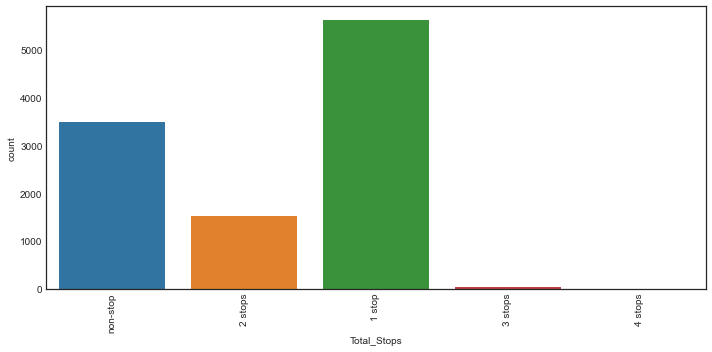

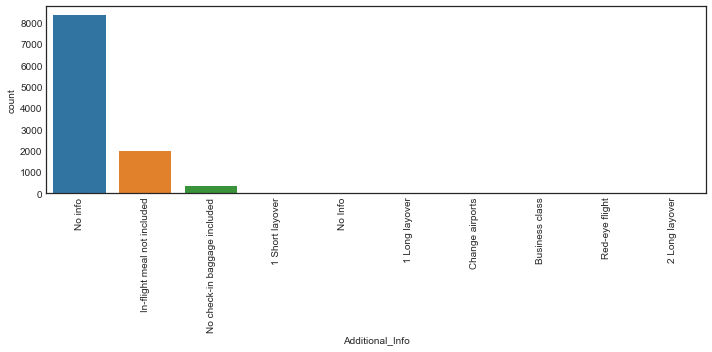

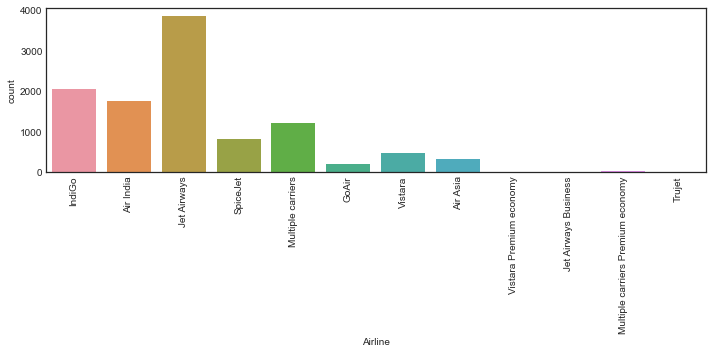

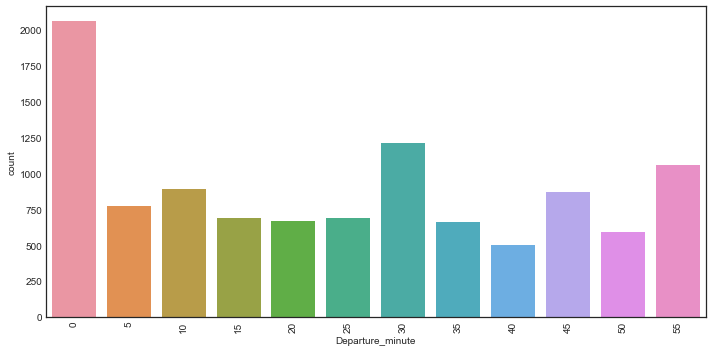

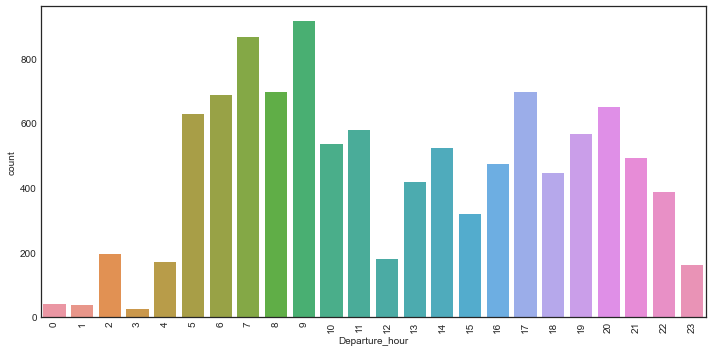

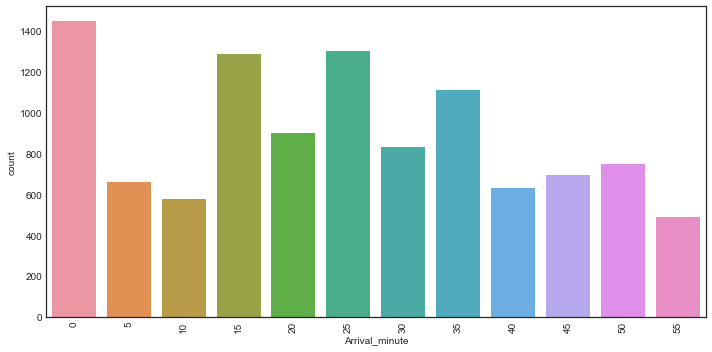

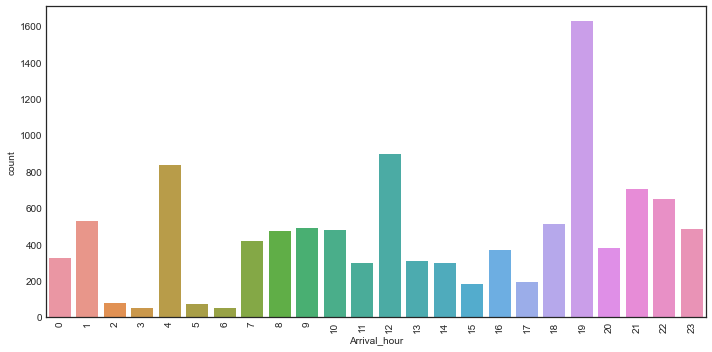

In [33]:
def generate_countplot(x):
    plt.figure(figsize=(10,5))
    sns.countplot(x)
    plt.xticks(rotation=90)
    plt.tight_layout()
    return plt.show()

generate_countplot(df_train['Total_Stops'])
generate_countplot(df_train['Additional_Info'])
generate_countplot(df_train['Airline'])
generate_countplot(df_train['Departure_minute'])
generate_countplot(df_train['Departure_hour'])
generate_countplot(df_train['Arrival_minute'])
generate_countplot(df_train['Arrival_hour'])

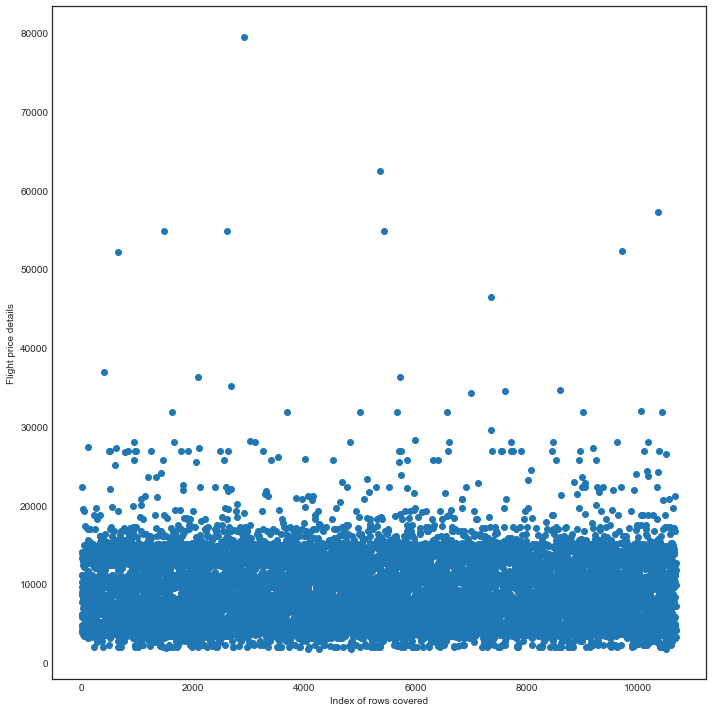

In [34]:
plt.style.use('fast')
plt.figure(figsize=(10,10))
plt.scatter(df_train.index, df_train['Price'])
plt.xlabel("Index of rows covered")
plt.ylabel("Flight price details")
plt.tight_layout()
plt.show()


we are able to see that most of the flight price values are accumulated between 0-20000 and very rare data points are distributed abov that number.


<AxesSubplot:xlabel='Source', ylabel='Price'>

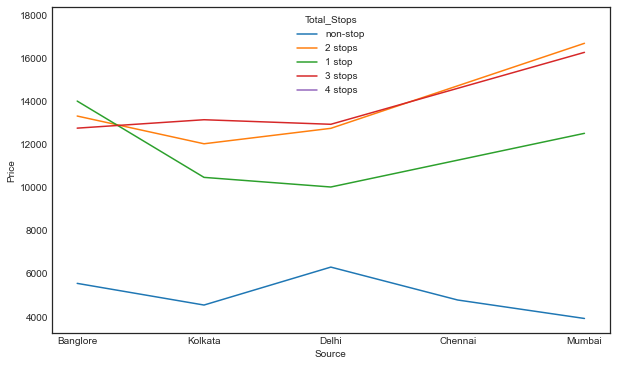

In [35]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Source', y='Price', hue='Total_Stops', data=df_train, ci=None)

we see that non stop flights have lower price irrespective of the source as compared to flights that have 1 or more than 1 stops in the fligh haul.


<AxesSubplot:xlabel='Destination', ylabel='Price'>

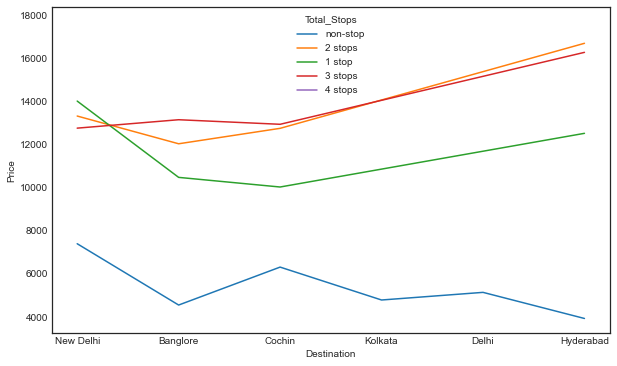

In [36]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Destination', y='Price', hue='Total_Stops', data=df_train, ci=None)

<AxesSubplot:xlabel='Month_of_Journey', ylabel='Price'>

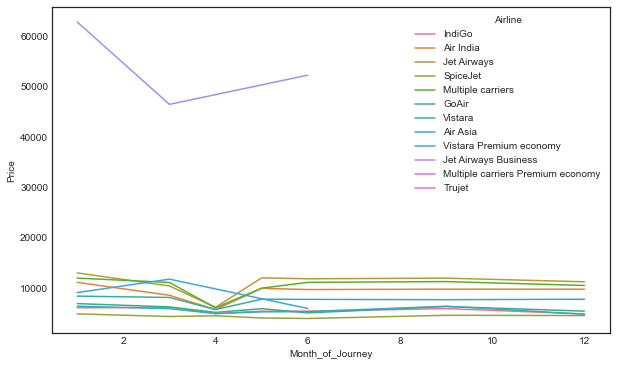

In [37]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Month_of_Journey', y='Price', hue='Airline', data=df_train, ci=None)

we see that Jet Airways Business class has the highest price than the rest possibly because the remaining offer the economy class data.


<AxesSubplot:xlabel='Day_of_Journey', ylabel='Price'>

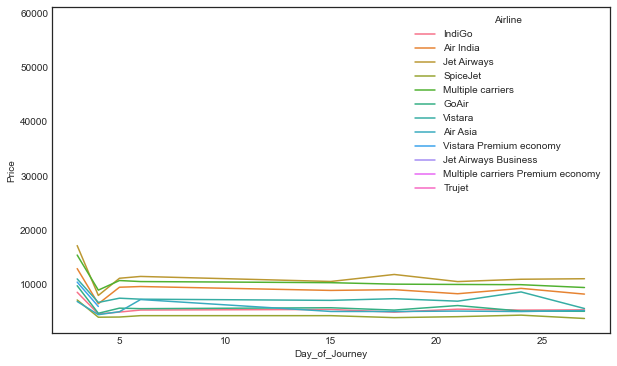

In [38]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Day_of_Journey', y='Price', hue='Airline', data=df_train, ci=None)

we see that all the airlines have high price between 1-5 days of a month and that reduces a bit on rest of the days apart from them.


<AxesSubplot:xlabel='Departure_minute', ylabel='Price'>

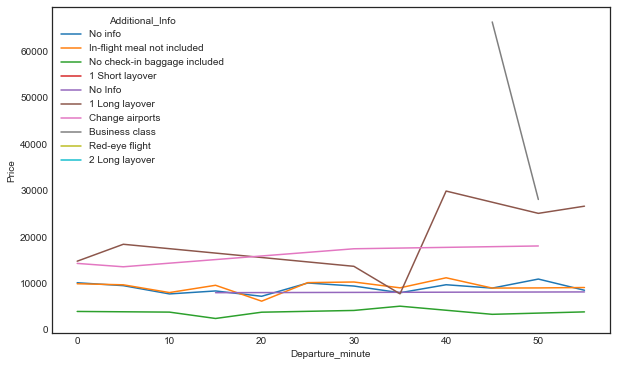

In [39]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Departure_minute', y='Price', hue='Additional_Info', data=df_train, ci=None)

<AxesSubplot:xlabel='Departure_hour', ylabel='Price'>

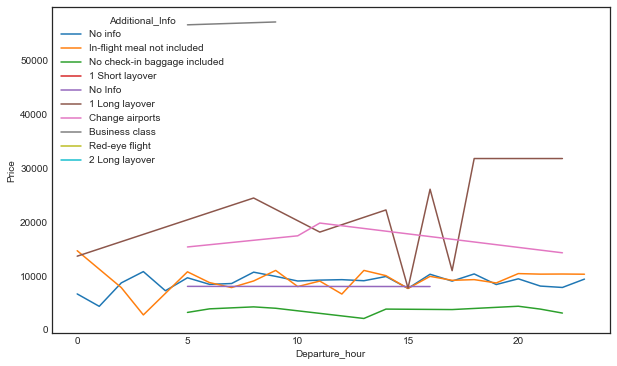

In [40]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Departure_hour', y='Price', hue='Additional_Info', data=df_train, ci=None)

<AxesSubplot:xlabel='Arrival_minute', ylabel='Price'>

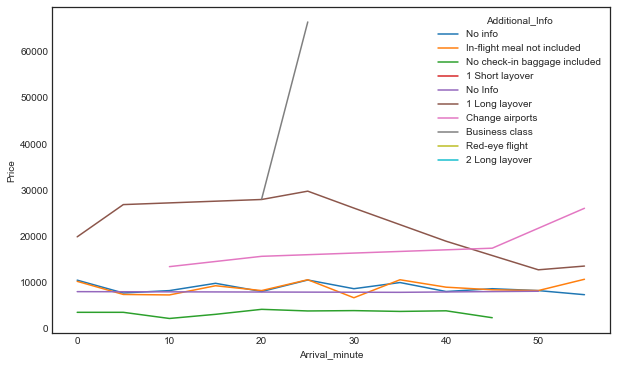

In [41]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Arrival_minute', y='Price', hue='Additional_Info', data=df_train, ci=None)

<AxesSubplot:xlabel='Arrival_hour', ylabel='Price'>

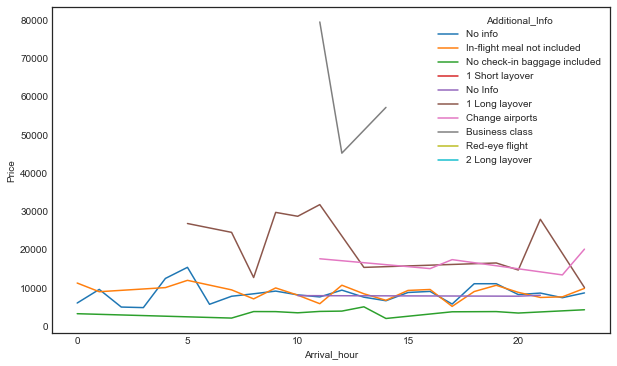

In [42]:
plt.figure(figsize=(10,6))
sns.lineplot(x='Arrival_hour', y='Price', hue='Additional_Info', data=df_train, ci=None)

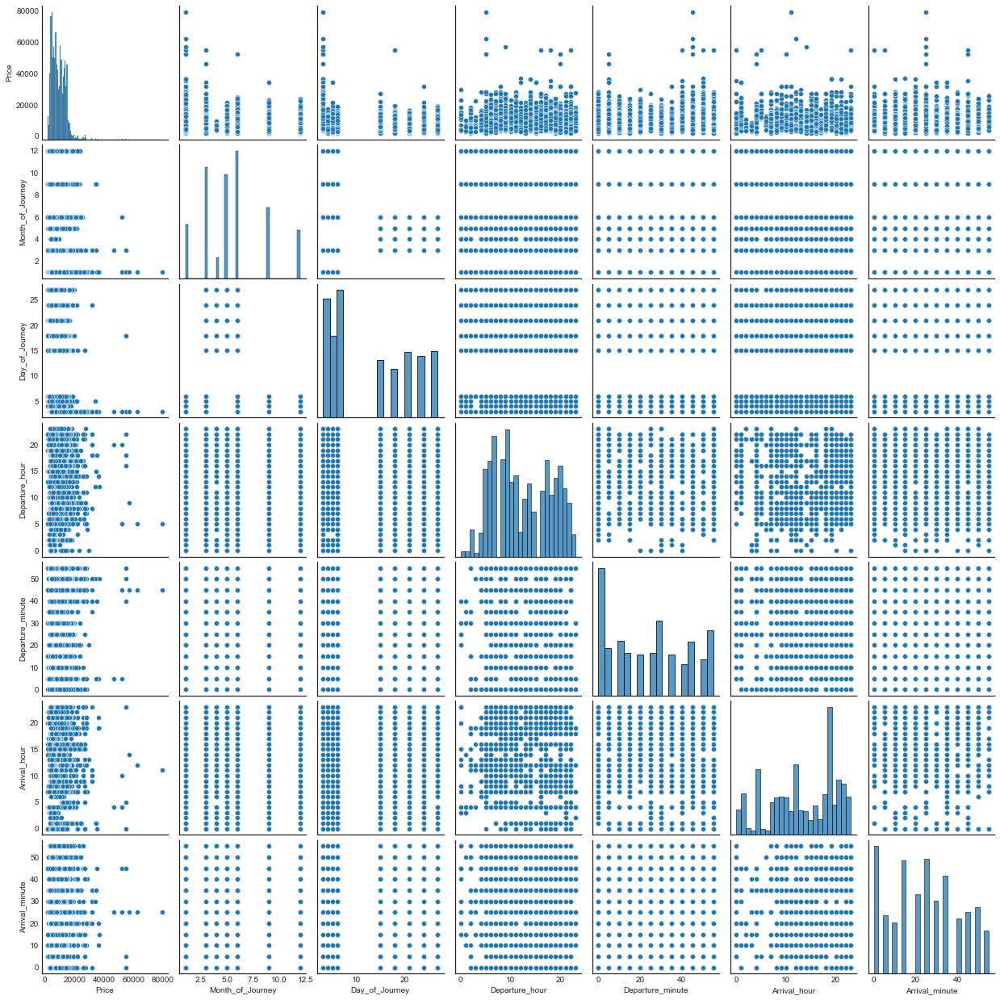

In [43]:
sns.pairplot(df_train)

The above paiplot gives us an indication on the numerical data considering the different airlines present in our dataset.

In [44]:
from sklearn.preprocessing import OrdinalEncoder

In [45]:
oe=OrdinalEncoder()
def ordinal_encoder(df, col):
    df[col]=oe.fit_transform(df[col])
    return df

df_train=ordinal_encoder(df_train,['Airline', 'Source', 'Destination', 'Total_Stops', 'Additional_Info'])

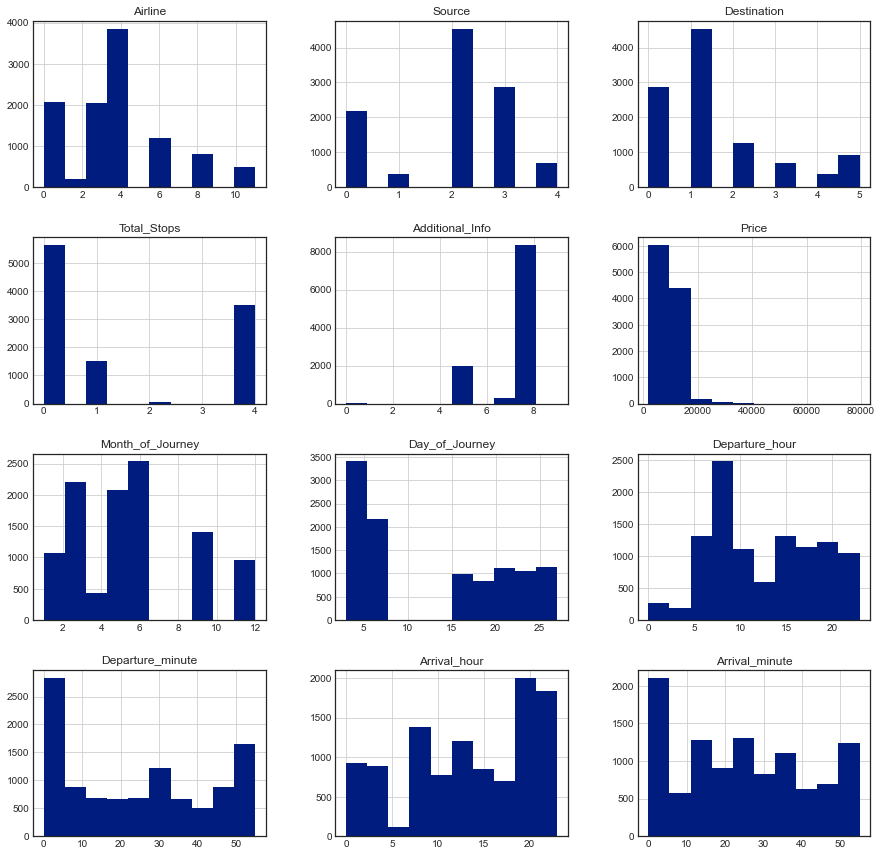

In [46]:
plt.style.use('seaborn-dark-palette')
df_train.hist(figsize=(15,15))
plt.show()


we are able to see the data distribution in our columns after the encoding technique was applied on all the categorical columns.


Airline                AxesSubplot(0.125,0.799681;0.110714x0.0803191)
Source              AxesSubplot(0.257857,0.799681;0.110714x0.0803191)
Destination         AxesSubplot(0.390714,0.799681;0.110714x0.0803191)
Total_Stops         AxesSubplot(0.523571,0.799681;0.110714x0.0803191)
Additional_Info     AxesSubplot(0.656429,0.799681;0.110714x0.0803191)
Price               AxesSubplot(0.789286,0.799681;0.110714x0.0803191)
Month_of_Journey       AxesSubplot(0.125,0.703298;0.110714x0.0803191)
Day_of_Journey      AxesSubplot(0.257857,0.703298;0.110714x0.0803191)
Departure_hour      AxesSubplot(0.390714,0.703298;0.110714x0.0803191)
Departure_minute    AxesSubplot(0.523571,0.703298;0.110714x0.0803191)
Arrival_hour        AxesSubplot(0.656429,0.703298;0.110714x0.0803191)
Arrival_minute      AxesSubplot(0.789286,0.703298;0.110714x0.0803191)
dtype: object

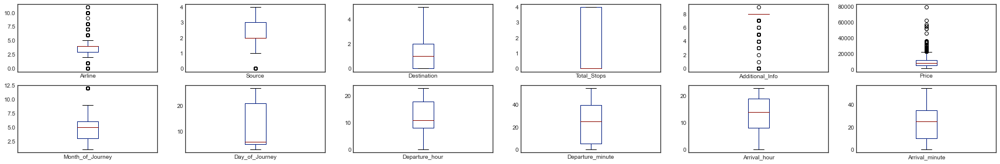

In [47]:
df_train.plot(kind='box',subplots =True, layout=(8,6),figsize=(30,20))

In [48]:
df_train.describe()   # check stastical summery

,Airline,Source,Destination,Total_Stops,Additional_Info,Price,Month_of_Journey,Day_of_Journey,Departure_hour,Departure_minute,Arrival_hour,Arrival_minute
count,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000,10682.000000
mean,3.966205,1.952256,1.436154,1.458248,7.392998,9087.214567,5.534731,12.682925,12.491013,24.409287,13.349186,24.690601
std,2.352090,1.177276,1.474845,1.806320,1.214254,4611.548810,2.987626,8.803800,5.748820,18.767801,6.859317,16.506808
min,0.000000,0.000000,0.000000,0.000000,0.000000,1759.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,2.000000,0.000000,0.000000,8.000000,5277.000000,3.000000,5.000000,8.000000,5.000000,8.000000,10.000000
50%,4.000000,2.000000,1.000000,0.000000,8.000000,8372.000000,5.000000,6.000000,11.000000,25.000000,14.000000,25.000000
75%,4.000000,3.000000,2.000000,4.000000,8.000000,12373.000000,6.000000,21.000000,18.000000,40.000000,19.000000,35.000000
max,11.000000,4.000000,5.000000,4.000000,9.000000,79512.000000,12.000000,27.000000,23.000000,55.000000,23.000000,55.000000


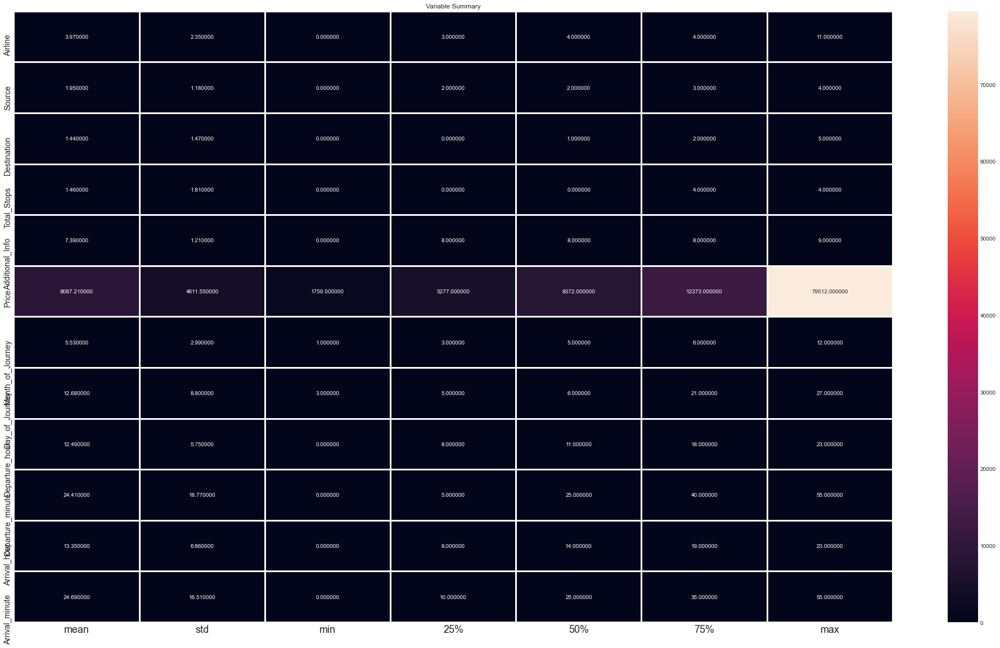

In [49]:
#lets visulized dataset

plt.figure(figsize=(35,20))
sns.heatmap(round(df_train.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt="f")
plt.xticks(fontsize=18)
plt.yticks(fontsize=14)
plt.title("Variable Summary")
plt.show()

Text(0.5, 1.0, 'Co-Relation')

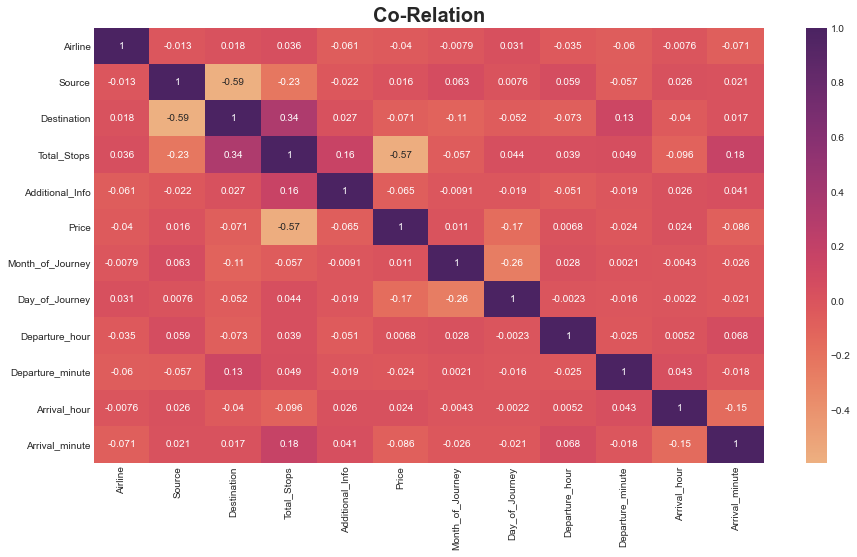

In [50]:
plt.figure(figsize=(15,8))
sns.heatmap(data=df_train.corr(),annot=True,cmap='flare')
plt.title('Co-Relation',fontdict={'fontweight':'bold','fontsize':20})

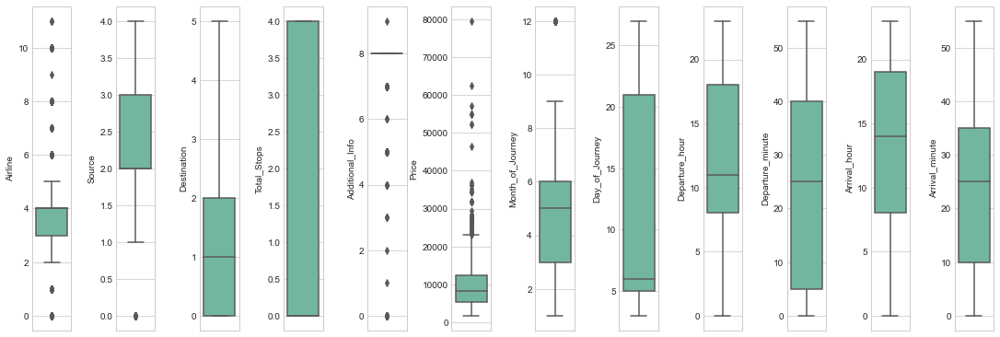

In [51]:
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(ncols=12, nrows=1, figsize=(15,5))
index = 0
ax = ax.flatten()
for col, value in df_train.items():
    sns.boxplot(y=col, data=df_train, ax=ax[index], palette="Set2")
    index += 1
plt.tight_layout(pad=0.4, w_pad=0.4, h_pad=1.0)
plt.show()


we are able to notice the outliers present in our dataset but since all of the feature columns are categorical data we will not have to worry about the presence of outliers here.

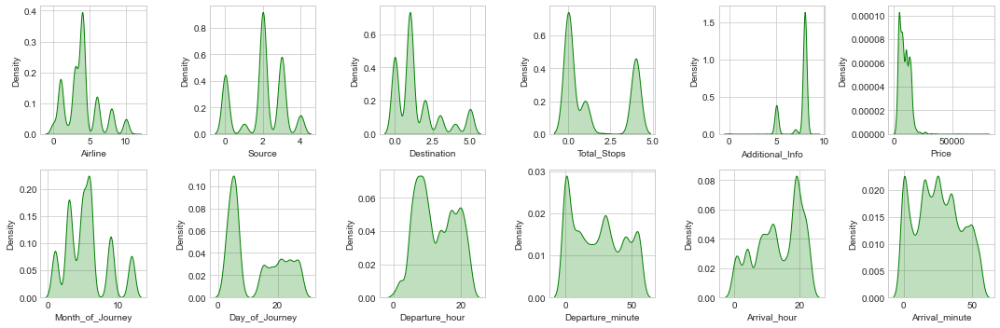

In [52]:
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(15,5))
index = 0
ax = ax.flatten()
for col, value in df_train.items():
    sns.distplot(value, ax=ax[index], hist=False, color="g", kde_kws={"shade": True})
    index += 1
plt.tight_layout()
plt.show()

Correlation Bar Plot comparing features with our label

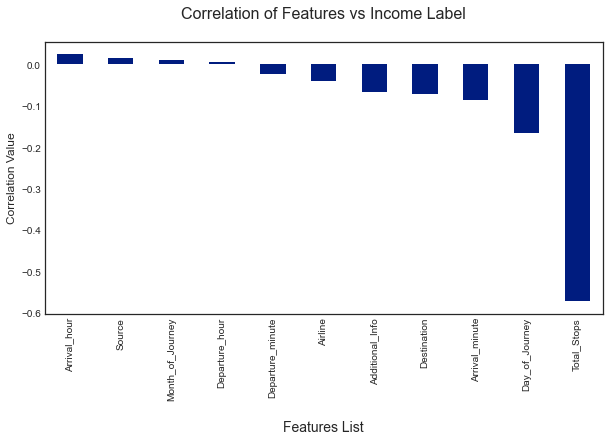

In [53]:
plt.style.use('seaborn-white')
df_corr = df_train.corr()
plt.figure(figsize=(10,5))
df_corr['Price'].sort_values(ascending=False).drop('Price').plot.bar()
plt.title("Correlation of Features vs Income Label\n", fontsize=16)
plt.xlabel("\nFeatures List", fontsize=14)
plt.ylabel("Correlation Value", fontsize=12)
plt.show()

we can see that only columns arrival hour, source, month of journey and departure hours are positively correlated with our target and remaining all our feature columns are negatively correlated where total stops is highly negatively correlated indicating that as the number of total stops in an itinerary increases the price of that particular flight increases
Splitting the dataset into 2 variables namely 'X' and 'Y' for features and label

In [66]:
from scipy.stats import zscore

In [68]:
#Train Dataset
z=np.abs(zscore(df_train))
df_train_new=df_train[(z<3).all(axis=1)]
df_train_new.shape

(10577, 12)

In [69]:
df_train=df_train_new

In [54]:
#splitting dataset into x and y.
x = df_train.drop('Price', axis=1)
y = df_train['Price']

In [55]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, power_transform

In [56]:
#splitting dataset into x and y.
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Airline,Source,Destination,Total_Stops,Additional_Info,Month_of_Journey,Day_of_Journey,Departure_hour,Departure_minute,Arrival_hour,Arrival_minute
0,-0.410805,-1.658359,2.416534,1.407210,0.499921,-0.848450,1.285536,1.654154,-0.234950,-1.800436,-0.890014
1,-1.261152,0.890014,-0.973812,-0.253703,0.499921,-1.517909,-0.872724,-1.303113,1.363607,-0.050909,-0.587094
2,0.014369,0.040556,-0.295743,-0.253703,0.499921,1.159928,-0.759131,-0.607286,0.031476,-1.363054,0.018745
3,-0.410805,0.890014,-0.973812,-0.807341,0.499921,2.164117,-0.872724,0.958326,-1.034229,1.407030,0.321664
4,-0.410805,-1.658359,2.416534,-0.807341,0.499921,-1.517909,-1.099909,0.610412,1.363607,1.115442,0.624584


In [57]:
y.head()

0     3897
1     7662
2    13882
3     6218
4    13302
Name: Price, dtype: int64

In [58]:
x.skew()

Airline             0.731057
Source             -0.424023
Destination         1.244046
Total_Stops         0.631532
Additional_Info    -1.779689
Month_of_Journey    0.629556
Day_of_Journey      0.367212
Departure_hour      0.112924
Departure_minute    0.167234
Arrival_hour       -0.370146
Arrival_minute      0.110945
dtype: float64

In [59]:
from sklearn.preprocessing import power_transform

In [60]:
# remove skewness
x1=power_transform(x,method='yeo-johnson')
x1=pd.DataFrame(x1)

In [61]:
x1.skew()

0    -0.002358
1     0.035953
2     0.119720
3     0.438720
4    -1.205784
5     0.009298
6     0.194490
7     0.007785
8     0.051541
9    -0.095225
10    0.020685
dtype: float64

In [62]:
x=x1

Finding the best random state for building Regression Models

In [63]:
# Importing Required Libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,accuracy_score,r2_score
from sklearn.model_selection import train_test_split

In [64]:
ln=LinearRegression()

In [70]:
for i in range(0,1500):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.30)
    ln.fit(x_train,y_train)
    pred_train=ln.predict(x_train)
    pred_test=ln.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,2)==round(r2_score(y_test,pred_test)*100,2):
        print("At Random score",i,"Model Performance is very well")
        print("Random stata is:",i)
        print("Train Score",r2_score(y_train,pred_train)*100)
        print("Test Score",r2_score(y_test,pred_test)*100)

At Random score 520 Model Performance is very well
Random stata is: 520
Train Score 31.14161432000624
Test Score 31.143335392265016
At Random score 671 Model Performance is very well
Random stata is: 671
Train Score 31.13720880829134
Test Score 31.13884270783909
At Random score 769 Model Performance is very well
Random stata is: 769
Train Score 31.097243243252226
Test Score 31.097036007562238
At Random score 1366 Model Performance is very well
Random stata is: 1366
Train Score 31.127787778656714
Test Score 31.126368293065852


In [71]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=978,test_size=0.20)

In [72]:
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

In [73]:
svr=SVR()
svrl=SVR(kernel='linear')
svrp=SVR(kernel='poly')
dtc=DecisionTreeRegressor()
knn=KNeighborsRegressor()

In [74]:
def fun(f):
    f.fit(x_train,y_train)
    pred=f.predict(x_test)
    print('Taining Score:-',f.score(x_train,y_train)*100)
    print('Mean Absolute Error',mean_absolute_error(y_test,pred))
    print('Mean Squared Error',mean_squared_error(y_test,pred))
    print('Root Mean Squared Erro',np.sqrt(mean_squared_error(y_test,pred)))
    print('R2 Score',r2_score(y_test,pred)*100)
    print("Test Score",f.score(x_test,y_test)*100)

In [75]:
fun(ln)

Taining Score:- 31.67067742046562
Mean Absolute Error 2817.012670331316
Mean Squared Error 15820765.258003723
Root Mean Squared Erro 3977.532559012399
R2 Score 29.224359688959332
Test Score 29.224359688959332


In [76]:
fun(dtc)

Taining Score:- 99.6147593446124
Mean Absolute Error 721.1525503041647
Mean Squared Error 4069048.087739822
Root Mean Squared Erro 2017.1881636921783
R2 Score 81.79674123408742
Test Score 81.79674123408742


In [77]:
fun(knn)

Taining Score:- 82.71504650190916
Mean Absolute Error 1376.8102948058024
Mean Squared Error 6652605.913411324
Root Mean Squared Erro 2579.26460709469
R2 Score 70.23895901492484
Test Score 70.23895901492484


In [79]:
fun(svr)

Taining Score:- 0.7619244369646672
Mean Absolute Error 3498.321349468813
Mean Squared Error 22173488.047905114
Root Mean Squared Erro 4708.873331053312
R2 Score 0.8048732834992745
Test Score 0.8048732834992745


In [80]:
fun(svrl)

Taining Score:- 23.918384376137425
Mean Absolute Error 2849.766422925423
Mean Squared Error 17261631.493145484
Root Mean Squared Erro 4154.711962717209
R2 Score 22.778512807872097
Test Score 22.778512807872097


In [81]:
fun(svrp)

Taining Score:- 1.0333604123519247
Mean Absolute Error 3483.52300509738
Mean Squared Error 22118976.132632215
Root Mean Squared Erro 4703.081557089162
R2 Score 1.0487373220020135
Test Score 1.0487373220020135


Regurization

In [82]:
from sklearn.linear_model import Lasso,Ridge,ElasticNet

In [83]:
ls=Lasso()
rd=Ridge()
es=ElasticNet()

In [84]:
fun(ls)

Taining Score:- 31.670619668113996
Mean Absolute Error 2816.862181093184
Mean Squared Error 15819751.359653277
Root Mean Squared Erro 3977.405103789816
R2 Score 29.22889545595877
Test Score 29.22889545595877


In [85]:
fun(rd)

Taining Score:- 31.670676827483213
Mean Absolute Error 2817.029529353523
Mean Squared Error 15820702.735593062
Root Mean Squared Erro 3977.5246995578873
R2 Score 29.224639388681585
Test Score 29.224639388681585


In [86]:
fun(es)

Taining Score:- 27.655564888589833
Mean Absolute Error 2966.9308305205113
Mean Squared Error 16542418.713387832
Root Mean Squared Erro 4067.237233477761
R2 Score 25.995976955599065
Test Score 25.995976955599065


Ensemble Method

In [87]:
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor

In [88]:
rfr=RandomForestRegressor()
adr=AdaBoostRegressor()
gfr=GradientBoostingRegressor()

In [89]:
fun(rfr)

Taining Score:- 98.14015765313474
Mean Absolute Error 646.5343412289888
Mean Squared Error 2626984.222566024
Root Mean Squared Erro 1620.7974033067871
R2 Score 88.24794582265535
Test Score 88.24794582265535


In [90]:
fun(adr)

Taining Score:- 50.724470650427044
Mean Absolute Error 2468.0293472313874
Mean Squared Error 11370801.965482181
Root Mean Squared Erro 3372.061975332331
R2 Score 49.13167746105675
Test Score 49.13167746105675


In [91]:
fun(gfr)

Taining Score:- 82.32716853780812
Mean Absolute Error 1284.0965774815443
Mean Squared Error 4129714.941942585
Root Mean Squared Erro 2032.1700081298773
R2 Score 81.52534251336594
Test Score 81.52534251336594


Hyper Parameter For Best Score

In [92]:
from sklearn.model_selection import GridSearchCV

In [93]:
p1={'n_estimators':[100,150,250,500],'max_depth':[3,5,7,9,11],'min_samples_split':[1,2,3],'min_samples_leaf':[1,2],'max_features':['auto','log2','sqrt']}

In [94]:
g1=GridSearchCV(rfr,p1)
g1.fit(x,y)
print(g1.best_params_)

{'max_depth': 11, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 250}


In [95]:
rfr1=RandomForestRegressor(max_depth=13,max_features='auto',min_samples_leaf=1,n_estimators=250)

In [96]:
fun(rfr1)

Taining Score:- 96.60129887292925
Mean Absolute Error 719.6693280236142
Mean Squared Error 2592672.946546826
Root Mean Squared Erro 1610.177923878857
R2 Score 88.40144045395449
Test Score 88.40144045395449


In [97]:
from sklearn.model_selection import cross_val_score

In [98]:
for i in range(2,11):
    score=cross_val_score(rfr1,x,y,cv=i)
    print("At value of cv=",i,' score is',score.mean())

At value of cv= 2  score is 0.8495304376608607
At value of cv= 3  score is 0.8648520465715733
At value of cv= 4  score is 0.8784293505990173
At value of cv= 5  score is 0.8846617536552481
At value of cv= 6  score is 0.8841349633948409
At value of cv= 7  score is 0.8884794050720917
At value of cv= 8  score is 0.889745214966928
At value of cv= 9  score is 0.8886032846378364
At value of cv= 10  score is 0.8929080588251171


In [99]:
for i in range(2,16):
    score=cross_val_score(dtc,x,y,cv=i)
    print("At value of cv=",i,' score is',score.mean())

At value of cv= 2  score is 0.7884155937694108
At value of cv= 3  score is 0.7951623131963116
At value of cv= 4  score is 0.8060020423601928
At value of cv= 5  score is 0.8057839308682
At value of cv= 6  score is 0.8096170774418411
At value of cv= 7  score is 0.8176468099023355
At value of cv= 8  score is 0.8194353027934805
At value of cv= 9  score is 0.8047873153892229
At value of cv= 10  score is 0.7988565648986912
At value of cv= 11  score is 0.8209856109698048
At value of cv= 12  score is 0.8231126178956397
At value of cv= 13  score is 0.8117410620438196
At value of cv= 14  score is 0.8217203355602611
At value of cv= 15  score is 0.8240970529362619


In [100]:
import pickle
filename='Flight_Price_Prediction.pkl'
pickle.dump(rfr1,open(filename,'wb'))

Conclusion

       Actual       Predict
10095    5403   5480.300205
1753     3943   4155.002527
4683     9314   9576.278721
7609     9646   9364.685302
434      4878   4962.029605
10530    6273   9133.805491
3440     6300   6598.893692
4138     5406   5326.220000
2649     4377   3930.842634
4350    14871  13219.423652
9794     6478   6903.342533
964      2017   2021.201981
8419     7934   7453.471838
6568    10031   9206.339587
8029    10031  11124.628729
1096     9187   9554.889600
9979    12284  12493.333950
7746     4823   4666.771424
1950    14781  14379.736858
776      6216   6221.596826
1608    10651  10301.620034
1034     5583   6608.678757
8510    12898  12861.921442
206      7048   6915.655207
10472    8016   8045.152802
9636    13067  13006.177308
10241   13069  10109.406436
8970     3873   4205.685078
3737     4409   5044.303438
2090     8586   9455.010326
4008    13376  13631.933406
4943     3384   4624.222543
2391     6171   6607.523942
1770     8266  10195.267862
2280    11050  12781

Text(0.5, 1.0, 'Random Forest Regressor')

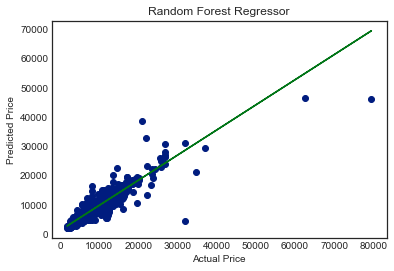

In [101]:
result=pd.DataFrame()
result['Actual']=y_test
result['Predict']=rfr1.predict(x_test)

print(result)

x=np.array(y_test)
y=np.array(rfr1.predict(x_test))

plt.plot(x,y,'o')

m,b=np.polyfit(x,y,1)

plt.plot(x,m*x+b)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Random Forest Regressor')

#Loading testing data

In [105]:
df_test = pd.read_excel("Test_set.xlsx")
df_test

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info
0,Jet Airways,6/06/2019,Delhi,Cochin,DEL → BOM → COK,17:30,04:25 07 Jun,10h 55m,1 stop,No info
1,IndiGo,12/05/2019,Kolkata,Banglore,CCU → MAA → BLR,06:20,10:20,4h,1 stop,No info
2,Jet Airways,21/05/2019,Delhi,Cochin,DEL → BOM → COK,19:15,19:00 22 May,23h 45m,1 stop,In-flight meal not included
3,Multiple carriers,21/05/2019,Delhi,Cochin,DEL → BOM → COK,08:00,21:00,13h,1 stop,No info
4,Air Asia,24/06/2019,Banglore,Delhi,BLR → DEL,23:55,02:45 25 Jun,2h 50m,non-stop,No info
5,Jet Airways,12/06/2019,Delhi,Cochin,DEL → BOM → COK,18:15,12:35 13 Jun,18h 20m,1 stop,In-flight meal not included
6,Air India,12/03/2019,Banglore,New Delhi,BLR → TRV → DEL,07:30,22:35,15h 5m,1 stop,No info
7,IndiGo,1/05/2019,Kolkata,Banglore,CCU → HYD → BLR,15:15,20:30,5h 15m,1 stop,No info
8,IndiGo,15/03/2019,Kolkata,Banglore,CCU → BLR,10:10,12:55,2h 45m,non-stop,No info
9,Jet Airways,18/05/2019,Kolkata,Banglore,CCU → BOM → BLR,16:30,22:35,6h 5m,1 stop,No info


I have imported the testing dataset now that only consists of feature columns and we need to predict the target label.

In [106]:
df_test.isna().sum()

Airline            0
Date_of_Journey    0
Source             0
Destination        0
Route              0
Dep_Time           0
Arrival_Time       0
Duration           0
Total_Stops        0
Additional_Info    0
dtype: int64

we do not have any null values present for our testing dataset which means we don't have to worry about handling them either.

In [107]:
print(f"Rows and Columns before dropping duplicates: ", df_test.shape)
df_test.drop_duplicates(inplace=True)
print(f"Rows and Columns after dropping duplicates: ", df_test.shape)

Rows and Columns before dropping duplicates:  (2671, 10)
Rows and Columns after dropping duplicates:  (2645, 10)


We are removing all the duplicate rows from our testing dataset using the drop_duplicates option.

In [108]:
df_test = date_bifurcation(df_test)
print(f"Rows and Columns:", df_test.shape)
df_test.head()

Rows and Columns: (2645, 10)


,Airline,Source,Destination,Dep_Time,Arrival_Time,Total_Stops,Additional_Info,Year_of_Journey,Month_of_Journey,Day_of_Journey
0,Jet Airways,Delhi,Cochin,17:30,04:25 07 Jun,1 stop,No info,2019,6,6
1,IndiGo,Kolkata,Banglore,06:20,10:20,1 stop,No info,2019,12,5
2,Jet Airways,Delhi,Cochin,19:15,19:00 22 May,1 stop,In-flight meal not included,2019,5,21
3,Multiple carriers,Delhi,Cochin,08:00,21:00,1 stop,No info,2019,5,21
4,Air Asia,Banglore,Delhi,23:55,02:45 25 Jun,non-stop,No info,2019,6,24


Using the date_bifurcation function we are able separate the date information and dropping all the unnecessary columns as well.


In [109]:
df_test = time_bifurcation(df_test)
print(f"Rows and Columns:", df_test.shape)
df_test.head()

Rows and Columns: (2645, 12)


,Airline,Source,Destination,Total_Stops,Additional_Info,Year_of_Journey,Month_of_Journey,Day_of_Journey,Departure_hour,Departure_minute,Arrival_hour,Arrival_minute
0,Jet Airways,Delhi,Cochin,1 stop,No info,2019,6,6,17,30,4,25
1,IndiGo,Kolkata,Banglore,1 stop,No info,2019,12,5,6,20,10,20
2,Jet Airways,Delhi,Cochin,1 stop,In-flight meal not included,2019,5,21,19,15,19,0
3,Multiple carriers,Delhi,Cochin,1 stop,No info,2019,5,21,8,0,21,0
4,Air Asia,Banglore,Delhi,non-stop,No info,2019,6,24,23,55,2,45


Using the time_bifurcation function we are separating time related values and creating additional columns from them.


In [110]:
df_test.drop("Year_of_Journey", axis=1, inplace=True)
df_test=ordinal_encoder(df_test, ['Airline', 'Source', 'Destination', 'Total_Stops', 'Additional_Info'])

In [111]:
df_test = pd.DataFrame(scaler.fit_transform(df_test), columns=df_test.columns)

we have transformed all our feature values in a normalized format to avoid biases in our regression mode

In [113]:
df_test['Airline'].value_counts()

 0.008716    886
-0.426286    509
-1.296290    432
 0.878721    343
 1.748725    208
 2.183727    129
-1.731292     86
-0.861288     45
 1.313723      3
 2.618729      2
 0.443719      2
Name: Airline, dtype: int64

Data Cleaning

In [127]:
#Test DataSet
z_test=np.abs(zscore(df_test))
df_test_new=df_test[(z_test<3).all(axis=1)]
df_test=df_test_new
X_test=df_test

           Predict
0     15325.549895
1      4985.706545
2     12893.362387
3     11072.405359
4      4652.544318
5     15324.374127
6      5738.662328
7      5937.380221
8      4758.181956
9     14393.416076
10     8613.882225
11     6629.963650
12    13053.998254
13    12821.152394
14    10304.066398
15    14557.155128
16     9399.509587
17    11845.642912
18    15326.365119
19    13714.872211
20     6297.678888
21     9032.432692
22    11039.771800
23    14210.498802
24     5912.162342
25     6658.226600
26     4780.341358
27    15885.312984
28    12367.553911
29    12459.735993
30     4360.724722
31     7946.200565
32    15274.704631
33     8018.015152
34     4238.332175
35     3492.887944
36     7773.898375
37    14019.651031
38     9416.521741
39     8705.253075
40     4216.521078
41    10842.627482
42     2034.570207
43     7933.678543
44     6586.017794
45     3610.738933
46    12709.402481
47     3119.686731
48    13252.705793
49     8753.003455
50    12290.783660
51     9782.

ValueError: x and y must have same first dimension, but have shapes (2137,) and (2642,)

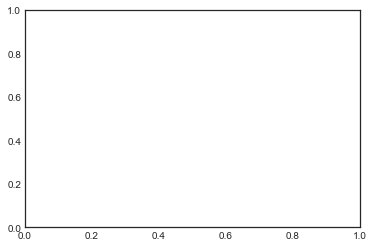

In [130]:
res=pd.DataFrame()
res['Predict']=rfr1.predict(X_test)

print(res)
x=np.array(y_test)
y=np.array(rfr1.predict(X_test))

plt.plot(x,y,'o')

m,b=np.polyfit(x,y,1)

plt.plot(x,m*x+b)
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Random Forest Regressor')